## Import Libraries


## Import Libraries


In [94]:
# ==============================================================
# Neural diffusion-advection stepper – variable Δt, no physics input
# ==============================================================

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

# ---- High-quality plotting setup for A0 poster printing ----
# PDF format preserves vector quality and scales perfectly for printing
import os
os.makedirs('advection figures', exist_ok=True)  # Create directory for figures

plt.rcParams['figure.dpi'] = 300  # DPI for display
plt.rcParams['savefig.format'] = 'pdf'  # PDF format for vector graphics (perfect quality)
plt.rcParams['savefig.pad_inches'] = 0.1
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 14
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman', 'DejaVu Serif']
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['grid.linewidth'] = 0.8
plt.rcParams['lines.linewidth'] = 2.5
plt.rcParams['lines.markersize'] = 6
plt.rcParams['lines.antialiased'] = True
plt.rcParams['patch.antialiased'] = True
plt.rcParams['text.antialiased'] = True
plt.rcParams['figure.max_open_warning'] = 0

# ---- Device setup (CPU / GPU) ----
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if torch.cuda.is_available():
    print("CUDA version:", torch.version.cuda)
    print("GPU:", torch.cuda.get_device_name(0))


Using device: cuda
CUDA version: 12.1
GPU: NVIDIA GeForce RTX 4090


## Diffusion-Advection Solver + Data Prep
Defines the solver, generates data, and prepares train/test splits.


Generating 1D diffusion-advection data...
Data shape: (25001, 256)


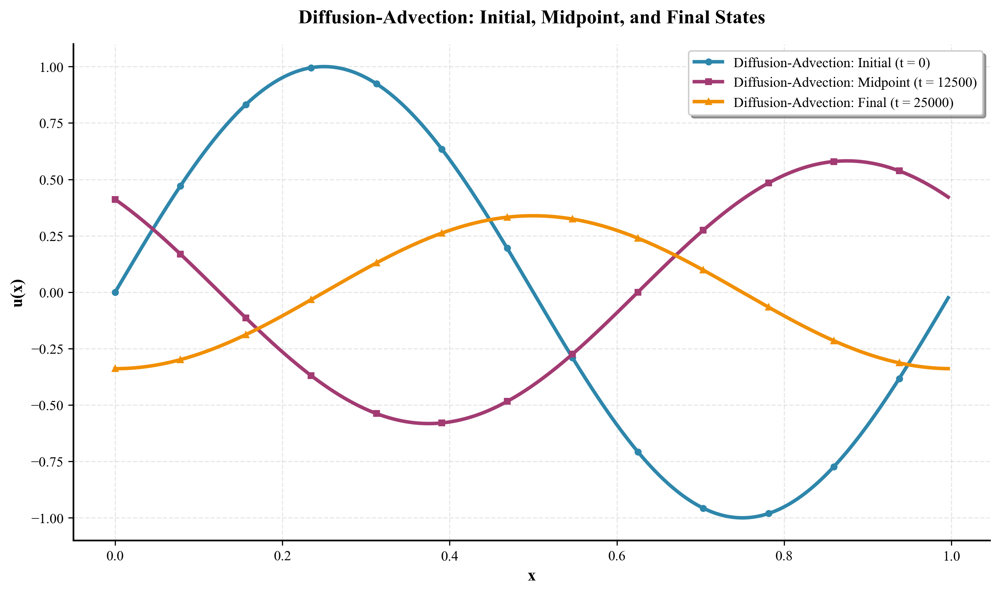

In [95]:
# ============================================================
# 1. 1D Diffusion-Advection Solver (Generate Data) - Periodic BCs
# ============================================================
def diffusion_advection_solver(u0, nu=0.01, c=0.5, dx=1/128, dt=1e-4, n_steps=50000):
    """
    Solves 1D diffusion-advection equation with Periodic BCs
    """
    u = u0.copy()
    traj = [u.copy()]
    for _ in range(n_steps):
        # Diffusion term: Laplacian with periodic BCs
        lap = (np.roll(u, -1) - 2*u + np.roll(u, 1)) / dx**2
        
        # Advection term: -c * du/dx (upwind scheme with periodic BCs)
        # For c > 0, use backward difference
        if c > 0:
            adv = -c * (u - np.roll(u, 1)) / dx
        else:
            adv = -c * (np.roll(u, -1) - u) / dx
        
        # Combined update
        u = u + nu * dt * lap + dt * adv
        traj.append(u.copy())

    return np.stack(traj)


# Generate 1D data
Nx = 256
dx = 1/Nx  # Grid spacing: if endpoint=False, x goes from 0 to 1-dx
dt0 = 1e-4
nu = 0.01
c = 0.5  # advection velocity
n_steps = 25000

# Use endpoint=False for periodic BCs: x from 0 to 1-dx
x = np.linspace(0, 1, Nx, endpoint=False)  # x from 0 to 1-dx
# Initial condition for periodic BCs: sin(2*pi*x) naturally satisfies periodicity
u0 = np.sin(2*np.pi*x)

print("Generating 1D diffusion-advection data...")
data = diffusion_advection_solver(u0, nu, c, dx, dt0, n_steps)
print(f"Data shape: {data.shape}")

fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

ax.plot(x, data[0], linewidth=2.5, label="Diffusion-Advection: Initial (t = 0)", color='#2E86AB', marker='o', markersize=4, markevery=20)
ax.plot(x, data[n_steps//2], linewidth=2.5, label=f"Diffusion-Advection: Midpoint (t = {n_steps//2})", color='#A23B72', marker='s', markersize=4, markevery=20)
ax.plot(x, data[-1], linewidth=2.5, label=f"Diffusion-Advection: Final (t = {n_steps})", color='#F18F01', marker='^', markersize=4, markevery=20)

ax.set_title("Diffusion-Advection: Initial, Midpoint, and Final States", fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel("x", fontsize=12, fontweight='bold')
ax.set_ylabel("u(x)", fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
ax.legend(frameon=True, fancybox=True, shadow=True, loc='best')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
# Save as PDF in advection figures folder (vector graphics preserve quality)
fig.savefig('advection figures/advection_initial_midpoint_final.pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
plt.show()

# Train/test split
T_train = 20000
u_train = torch.tensor(data[:T_train], dtype=torch.float32, device=device)
u_test_true = torch.tensor(data[T_train:], dtype=torch.float32, device=device)


## Define MLP Stepper Model
Neural time-stepper with 4 hidden layers (128 units each) and Adam optimizer.


In [ ]:
# -----------------------
# 3. Model 
# -----------------------
class MLPStepper(nn.Module):
    def __init__(self, in_dim=4, hidden=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden), nn.ReLU(),
            nn.Linear(hidden, hidden), nn.ReLU(),
            nn.Linear(hidden, hidden), nn.ReLU(),
            nn.Linear(hidden, 1)
        )
    def forward(self, u_left, u_center, u_right, dt_norm):

        inp = torch.stack([u_left, u_center, u_right, dt_norm], dim=-1)
        du = self.net(inp).squeeze(-1)
        return u_center + dt0*dt_norm*du

model = MLPStepper().to(device)
initial_lr = 1e-4
opt = optim.Adam(model.parameters(), lr=initial_lr)
loss_fn = nn.MSELoss()

# Learning rate scheduler parameters
use_lr_scheduler = True  # Set to False to use fixed learning rate
lr_schedule_type = 'exponential'  # Options: 'step', 'exponential', 'cosine', 'reduce_on_plateau'
# 'step': decreases by factor every N epochs
# 'exponential': decreases exponentially each epoch
# 'cosine': cosine annealing schedule
# 'reduce_on_plateau': reduces when loss plateaus

# Initialize learning rate scheduler
if use_lr_scheduler:
    if lr_schedule_type == 'step':
        # Decrease by factor 0.5 every 100 epochs
        scheduler = optim.lr_scheduler.StepLR(opt, step_size=100, gamma=0.5)
    elif lr_schedule_type == 'exponential':
        # Exponential decay: gamma^epoch
        scheduler = optim.lr_scheduler.ExponentialLR(opt, gamma=0.995)
    elif lr_schedule_type == 'cosine':
        # Cosine annealing
        scheduler = optim.lr_scheduler.CosineAnnealingLR(opt, T_max=500, eta_min=1e-6)
    elif lr_schedule_type == 'reduce_on_plateau':
        # Reduce when loss plateaus
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=25, verbose=True)
    else:
        scheduler = None
        use_lr_scheduler = False
else:
    scheduler = None

print(f"Initial learning rate: {initial_lr}")
if use_lr_scheduler:
    print(f"Learning rate scheduler: {lr_schedule_type}")


Initial learning rate: 0.0001
Learning rate scheduler: exponential


## Training Loop with Learning Rate Scheduler
Trains the model with diminishing learning rate schedule.


In [ ]:
# Training parameters
max_epochs = 500
batch_size = 512
max_mult = 8
patience = 75  # Early stopping patience
min_delta = 1e-10  # Minimum improvement threshold

u = u_train

epoch_losses = []  # Track losses per epoch
best_loss = float('inf')
patience_counter = 0
best_epoch = 0
learning_rate_history = []  # Track learning rate changes

for epoch in range(max_epochs):
    losses = []
    
    # Get current learning rate
    current_lr = opt.param_groups[0]['lr']
    learning_rate_history.append(current_lr)

    for mult in range(1, max_mult + 1):   # iterate dt=1..max_mult

        num_batches = (u.shape[0] - mult - 1) // batch_size

        for _ in range(num_batches):

            # random times but fixed dt per pass
            t = torch.randint(0, u.shape[0] - mult - 1,
                              (batch_size,), device=device)

            # dt = mult for whole batch
            dt_mult = torch.full((batch_size, 1),
                                 float(mult), device=device)

            # expand dt to match spatial dim
            dt_norm = dt_mult.repeat(1, u.shape[1])

            u_t = u[t]
            u_next = u[t + mult]

            # Periodic BCs: use torch.roll for neighbors
            u_left  = torch.roll(u_t, +1, dims=1)   # u[i-1] with periodic wrapping
            u_right = torch.roll(u_t, -1, dims=1)   # u[i+1] with periodic wrapping

            u_pred = model(u_left, u_t, u_right, dt_norm)

            delta_true = u_next - u_t
            delta_pred = u_pred - u_t
            loss = ((delta_pred - delta_true)**2).mean()

            opt.zero_grad()
            loss.backward()
            opt.step()

            losses.append(loss.item())

    avg_loss = np.mean(losses)
    epoch_losses.append(avg_loss)
    
    # Update learning rate scheduler
    if use_lr_scheduler and scheduler is not None:
        if lr_schedule_type == 'reduce_on_plateau':
            scheduler.step(avg_loss)  # ReduceLROnPlateau needs the loss value
        else:
            scheduler.step()  # Other schedulers step at end of epoch
    
    # Early stopping check
    if avg_loss < best_loss - min_delta:
        best_loss = avg_loss
        best_epoch = epoch + 1
        patience_counter = 0
    else:
        patience_counter += 1
    
    print(f"Epoch {epoch+1}/{max_epochs} - MSE: {avg_loss:.6e} (Best: {best_loss:.6e} @ epoch {best_epoch}) - LR: {current_lr:.2e}")
    
    # Early stopping
    if patience_counter >= patience:
        print(f"\nEarly stopping at epoch {epoch+1}. No improvement for {patience} epochs.")
        print(f"Best loss: {best_loss:.6e} at epoch {best_epoch}")
        break


NameError: name 'current_max_mult' is not defined

## Plot Learning Rate Schedule
Visualizes how the learning rate decreases over training epochs.


In [ ]:
# Plot learning rate schedule
if use_lr_scheduler and len(learning_rate_history) > 0:
    fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
    
    epochs = range(1, len(learning_rate_history) + 1)
    ax.plot(epochs, learning_rate_history, linewidth=2.5, 
            color='#A23B72', marker='o', markersize=3, markevery=max(1, len(epochs)//20),
            label=f'Learning Rate ({lr_schedule_type} schedule)')
    
    ax.set_xlabel("Epoch", fontsize=12, fontweight='bold')
    ax.set_ylabel("Learning Rate", fontsize=12, fontweight='bold')
    ax.set_title(f"Diffusion-Advection: Learning Rate Schedule ({lr_schedule_type})", 
                 fontsize=14, fontweight='bold', pad=15)
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
    ax.legend(frameon=True, fancybox=True, shadow=True)
    ax.set_yscale('log')  # Use log scale for better visualization
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    fig.savefig(f'advection figures/advection_learning_rate_schedule_{lr_schedule_type}.pdf', 
                bbox_inches='tight', facecolor='white', edgecolor='none')
    plt.show()
    
    print(f"Learning rate schedule: Started at {learning_rate_history[0]:.2e}, "
          f"ended at {learning_rate_history[-1]:.2e}")
else:
    print("Learning rate scheduler not used or no history available.")


## Plot Diminishing Step Size Schedule
Visualizes how the maximum multiplier decreases over training epochs.


## Plot Training MSE vs Epoch


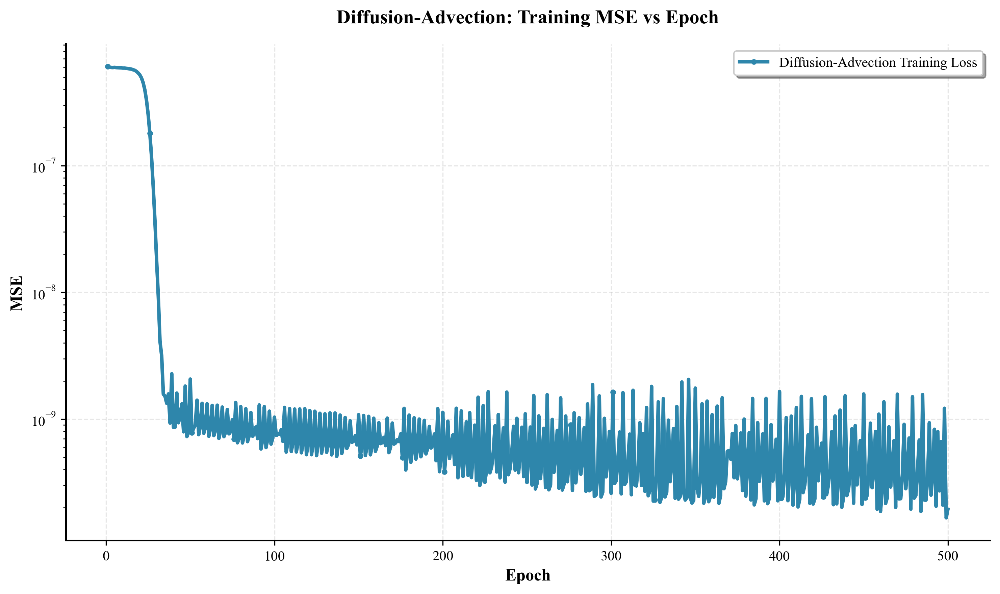

Final MSE: 1.940674e-10
Best MSE: 1.662126e-10 (at epoch 499)


In [ ]:
# %%
# Plot MSE vs Epoch
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

ax.plot(range(1, len(epoch_losses) + 1), epoch_losses, linewidth=2.5, 
        color='#2E86AB', marker='o', markersize=3, markevery=max(1, len(epoch_losses)//20), 
        label='Diffusion-Advection Training Loss')

ax.set_xlabel("Epoch", fontsize=12, fontweight='bold')
ax.set_ylabel("MSE", fontsize=12, fontweight='bold')
ax.set_title("Diffusion-Advection: Training MSE vs Epoch", fontsize=14, fontweight='bold', pad=15)
ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
ax.set_yscale('log')  # Use log scale for better visualization
ax.legend(frameon=True, fancybox=True, shadow=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
# Save as PDF in advection figures folder (vector graphics preserve quality)
fig.savefig('advection figures/advection_mse_vs_epoch.pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
plt.show()

# Also print final MSE
print(f"Final MSE: {epoch_losses[-1]:.6e}")
print(f"Best MSE: {min(epoch_losses):.6e} (at epoch {np.argmin(epoch_losses)+1})")


## Save Model


## Save Model


In [ ]:
torch.save(model.state_dict(), "neural_diffusion_advection_stepper27.1.pt")
print("Model saved!")


Model saved!


## Import Model, I did this so we don't have to train everytime


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

model = MLPStepper().to(device)

model.load_state_dict(torch.load("neural_diffusion_advection_stepper27.1.pt", map_location=device))
model.eval()
print("Model loaded successfully!")



Using device: cuda
Model loaded successfully!


C:\Users\amt35\AppData\Local\Temp\ipykernel_26456\3522710946.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("neural_diffusion_advection

## Rollout on Test Region
Generates predicted trajectory and collects true vs predicted states.


In [ ]:
# %%
# =============================================================
# Plot: True vs Predicted (Rollout on Test Region) - Periodic BCs
# =============================================================

model.eval()

# start from the FIRST test frame (t = T_train)
u_pred = u_test_true[0].clone()     # prediction rollout starts here
u_pred = u_pred.unsqueeze(0)        # [1, Nx]

rollout_pred = [u_pred[0].detach().cpu().numpy()]
rollout_true = [u_test_true[0].detach().cpu().numpy()]

steps = u_test_true.shape[0] 

with torch.no_grad():
    for t in range(steps - 1):
        u_now = u_pred[-1] if isinstance(u_pred, list) else u_pred[0]
        u_now = u_now.to(device)

        # Periodic BCs: use torch.roll for neighbors
        u_left  = torch.roll(u_now, +1)   # u[i-1] with periodic wrapping
        u_right = torch.roll(u_now, -1)   # u[i+1] with periodic wrapping

        dt_mult = torch.full((1, 1), 1.0, device=device) # dt=1 for single step rollout
        dt_norm = dt_mult.repeat(1, u_now.shape[0])

        u_next = model(u_left.unsqueeze(0), u_now.unsqueeze(0), u_right.unsqueeze(0), dt_norm)
        
        # Extract first (and only) batch element: (1, Nx) -> (Nx,)
        u_next = u_next[0] if len(u_next.shape) > 1 else u_next

        u_pred = u_next.unsqueeze(0)
        rollout_pred.append(u_next.detach().cpu().numpy())
        rollout_true.append(u_test_true[t+1].detach().cpu().numpy())

rollout_pred = np.stack(rollout_pred)
rollout_true = np.stack(rollout_true)

print("Rollout shape:", rollout_pred.shape)

Rollout shape: (5001, 256)


In [ ]:
dt0*n_steps

2.5

## Multi-Multiplier Comparison (Subplots)
Shows true vs predicted snapshots for several dts


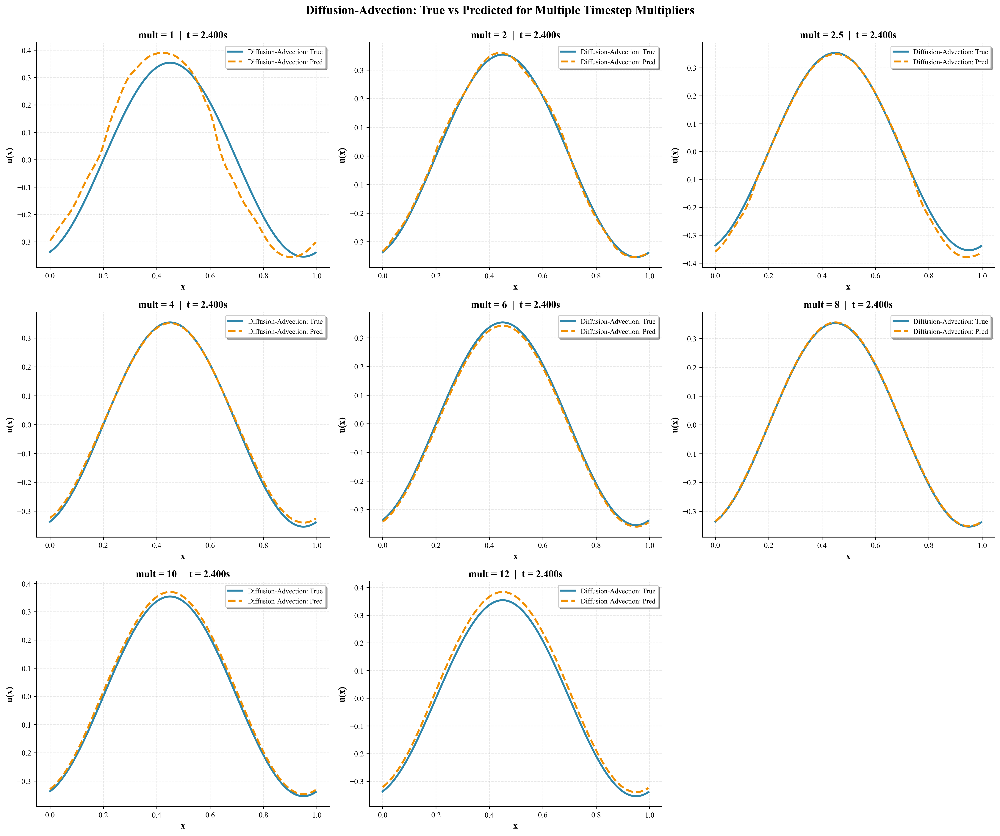

In [ ]:
# =============================================================
# Plot: True vs Predicted for Multiple Timestep Multipliers (Subplots) - Periodic BCs
# =============================================================

dt0 = 1e-4
train_end_step = T_train
snapshot_index = -1000

idx = snapshot_index % len(rollout_true)
global_step = train_end_step + idx
t_snapshot = global_step * dt0

multipliers = [1,2,2.5,4,6,8,10,12]   # 1,3,5,...,15
n = len(multipliers)

cols = 3
rows = int(np.ceil(n / cols))

fig = plt.figure(figsize=(18, 5 * rows), dpi=300)
fig.suptitle("Diffusion-Advection: True vs Predicted for Multiple Timestep Multipliers", 
             fontsize=16, fontweight='bold', y=0.995)

for i, mult in enumerate(multipliers, 1):

    model.eval()

    # --- rollout for this multiplier ---
    u_pred = u_test_true[0].clone().unsqueeze(0)

    rollout_pred_mult = [u_pred[0].detach().cpu().numpy()]
    rollout_true_mult = [u_test_true[0].detach().cpu().numpy()]

    steps = int(u_test_true.shape[0] // mult)  # Convert to int for range()

    with torch.no_grad():
        for t in range(steps - 1):
            u_now = torch.from_numpy(rollout_pred_mult[-1]).to(device)

            # Periodic BCs: use torch.roll for neighbors
            u_left  = torch.roll(u_now, +1)   # u[i-1] with periodic wrapping
            u_right = torch.roll(u_now, -1)   # u[i+1] with periodic wrapping
            
            dt_vec = torch.ones_like(u_now) * mult

            u_next = model(u_left.unsqueeze(0), u_now.unsqueeze(0), u_right.unsqueeze(0), dt_vec.unsqueeze(0))
            
            # Extract first (and only) batch element: (1, Nx) -> (Nx,)
            u_next = u_next[0] if len(u_next.shape) > 1 else u_next

            rollout_pred_mult.append(u_next.detach().cpu().numpy())
            # Convert to int for array indexing (handles float multipliers like 2.5)
            true_idx = int((t + 1) * mult)
            rollout_true_mult.append(
                u_test_true[true_idx].detach().cpu().numpy()
            )

    rollout_pred_mult = np.stack(rollout_pred_mult)
    rollout_true_mult = np.stack(rollout_true_mult)

    # index adjusted for this multiplier (convert to int for array indexing)
    idx_mult = int(idx // mult)
    # Ensure index is within bounds
    idx_mult = min(idx_mult, len(rollout_true_mult) - 1)

    # --- subplot ---
    ax = plt.subplot(rows, cols, i)

    ax.plot(x, rollout_true_mult[idx_mult],
            label="Diffusion-Advection: True", linewidth=2.5, color='#2E86AB')
    ax.plot(x, rollout_pred_mult[idx_mult],
            label="Diffusion-Advection: Pred", linewidth=2.5, linestyle="--", color='#F18F01')

    ax.set_title(f"mult = {mult}  |  t = {t_snapshot:.3f}s", fontweight='bold')
    ax.set_xlabel("x", fontweight='bold')
    ax.set_ylabel("u(x)", fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
    ax.legend(frameon=True, fancybox=True, shadow=True, fontsize=9)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
# Save as PDF in advection figures folder (vector graphics preserve quality)
fig.savefig('advection figures/advection_multiplier_comparison.pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
plt.show()


## Multi-Time Snapshots per Multiplier
Plots true vs predicted snapshots at several times for each Δt multiplier.


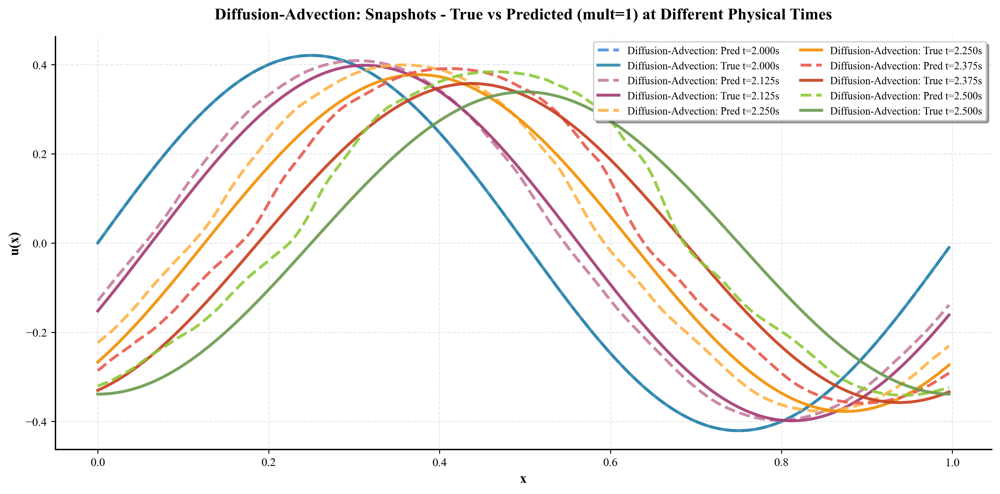

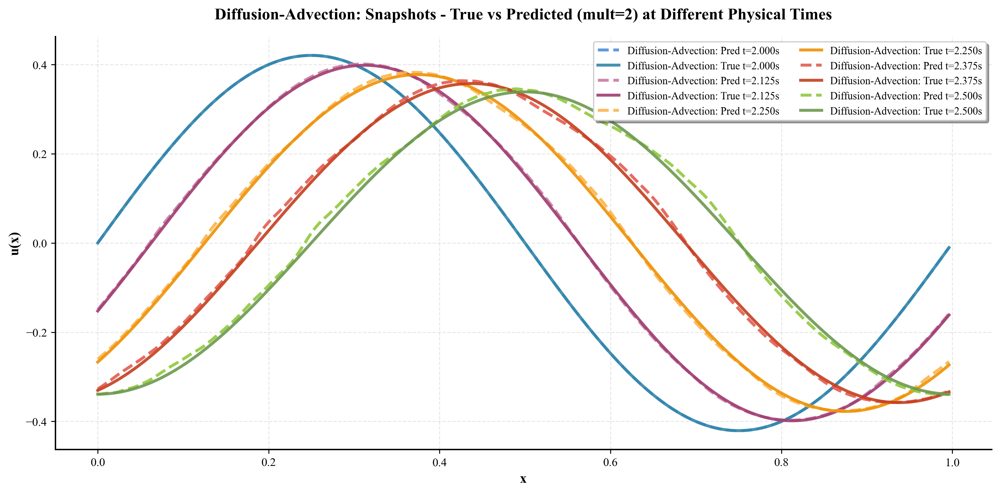

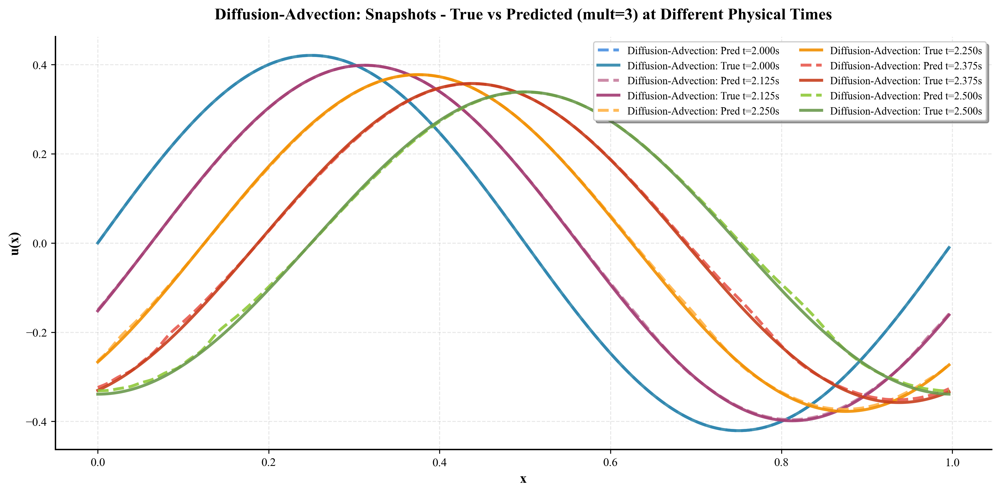

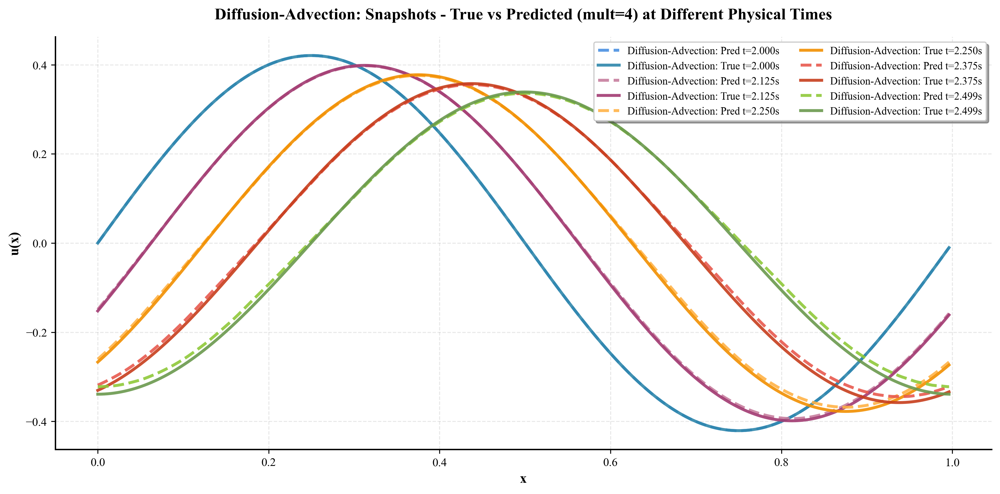

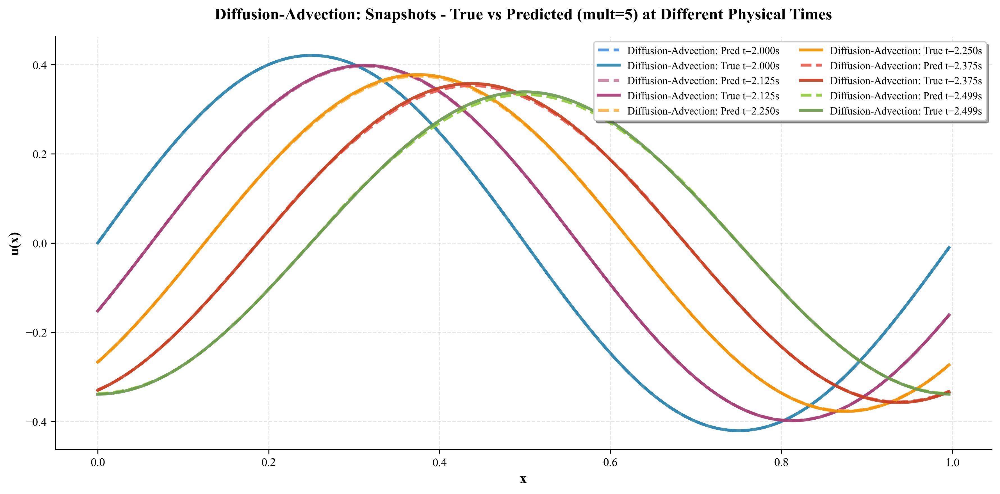

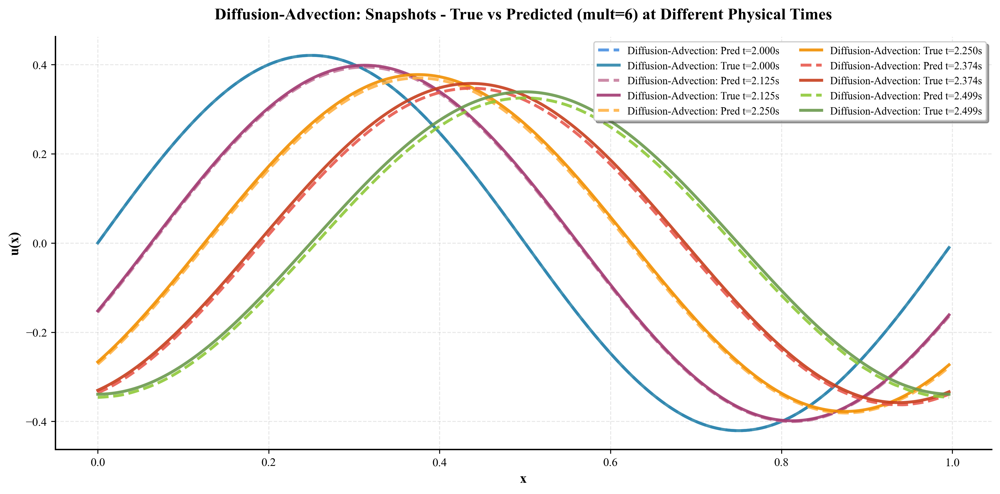

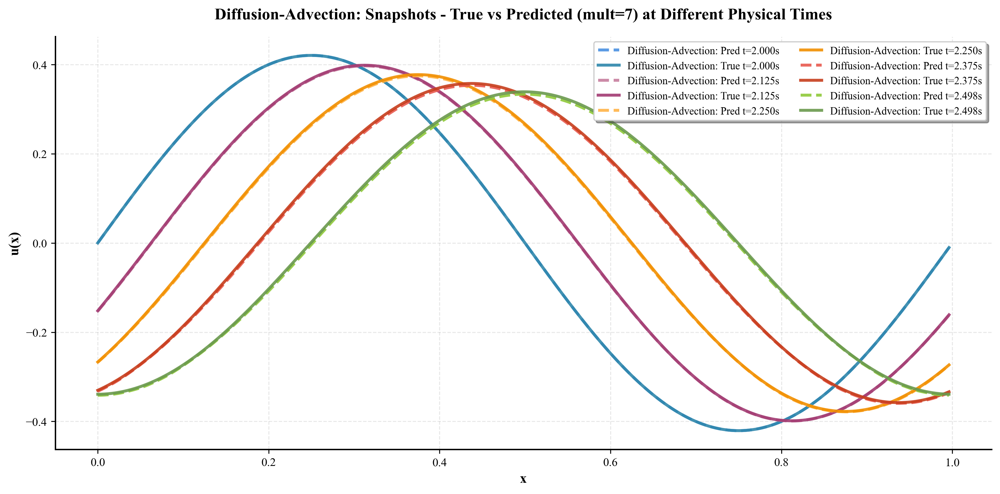

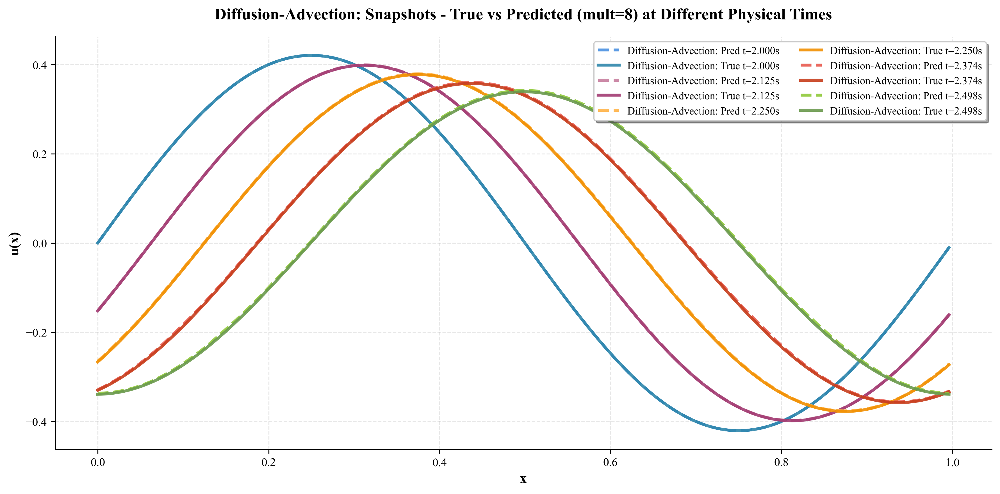

In [ ]:
# %%
# =============================================================
# Plot: Snapshots at Multiple Times for Different Multipliers - Periodic BCs
# =============================================================

dt0 = 1e-4
train_end_step = T_train   # 20000

# Loop over multipliers 1 through 8
for mult in range(1, 9):
    
    # ===== Run rollout for this multiplier =====
    model.eval()
    
    u_pred = u_test_true[0].clone()
    u_pred = u_pred.unsqueeze(0)
    
    rollout_pred_mult = [u_pred[0].detach().cpu().numpy()]
    rollout_true_mult = [u_test_true[0].detach().cpu().numpy()]
    
    # Adjust number of steps based on multiplier
    steps_mult = u_test_true.shape[0] // mult
    
    with torch.no_grad():
        for t in range(steps_mult - 1):
            
            u_now = rollout_pred_mult[-1]
            u_now = torch.from_numpy(u_now).to(device)
            
            # Periodic BCs: use torch.roll for neighbors
            u_left  = torch.roll(u_now, +1)   # u[i-1] with periodic wrapping
            u_right = torch.roll(u_now, -1)   # u[i+1] with periodic wrapping
            
            # dt = mult * dt0 for this multiplier
            dt_vec = torch.ones_like(u_now) * mult
            
            u_next = model(u_left.unsqueeze(0), u_now.unsqueeze(0), u_right.unsqueeze(0), dt_vec.unsqueeze(0))
            
            # Extract first (and only) batch element: (1, Nx) -> (Nx,)
            u_next = u_next[0] if len(u_next.shape) > 1 else u_next
            
            rollout_pred_mult.append(u_next.detach().cpu().numpy())
            rollout_true_mult.append(u_test_true[t * mult + mult].detach().cpu().numpy())
            
    rollout_pred_mult = np.stack(rollout_pred_mult)
    rollout_true_mult = np.stack(rollout_true_mult)
    
    # ===== Plot snapshots for this multiplier =====
    snapshot_ids = [0, steps_mult//4, steps_mult//2, 3*steps_mult//4, steps_mult-2]
    
    fig, ax = plt.subplots(figsize=(12, 6), dpi=300)
    
    colors_true = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#6A994E']
    colors_pred = ['#4A90E2', '#C77D9E', '#FFB347', '#E85A4F', '#8FC93A']
    
    for idx, sid in enumerate(snapshot_ids):
        t_global = (train_end_step + sid * mult) * dt0
        ax.plot(x, rollout_pred_mult[sid], label=f"Diffusion-Advection: Pred t={t_global:.3f}s", 
                linestyle="--", linewidth=2.5, color=colors_pred[idx], alpha=0.9)
        ax.plot(x, rollout_true_mult[sid], label=f"Diffusion-Advection: True t={t_global:.3f}s", 
                linewidth=2.5, color=colors_true[idx], alpha=0.9)
    
    ax.set_title(f"Diffusion-Advection: Snapshots - True vs Predicted (mult={mult}) at Different Physical Times", 
                 fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel("x", fontsize=12, fontweight='bold')
    ax.set_ylabel("u(x)", fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
    ax.legend(ncol=2, frameon=True, fancybox=True, shadow=True, fontsize=9)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    # Save as PDF in advection figures folder (vector graphics preserve quality)
    fig.savefig(f'advection figures/advection_snapshots_mult{mult}.pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
    plt.show()


## Rollout MSE Over Time
Plots MSE between true and predicted states across rollout steps.


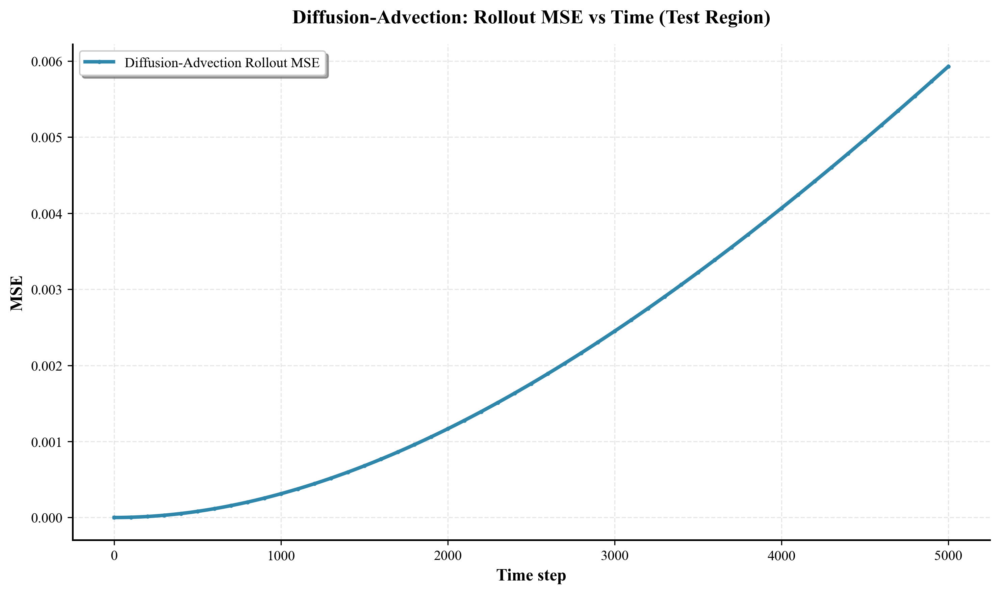

In [ ]:
# %%
mse_t = ((rollout_pred - rollout_true)**2).mean(axis=1)

fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

ax.plot(mse_t, linewidth=2.5, color='#2E86AB', label='Diffusion-Advection Rollout MSE', 
        marker='o', markersize=2, markevery=max(1, len(mse_t)//50))

ax.set_title("Diffusion-Advection: Rollout MSE vs Time (Test Region)", fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel("Time step", fontsize=12, fontweight='bold')
ax.set_ylabel("MSE", fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
ax.legend(frameon=True, fancybox=True, shadow=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
# Save as PDF in advection figures folder (vector graphics preserve quality)
fig.savefig('advection figures/advection_rollout_mse.pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
plt.show()


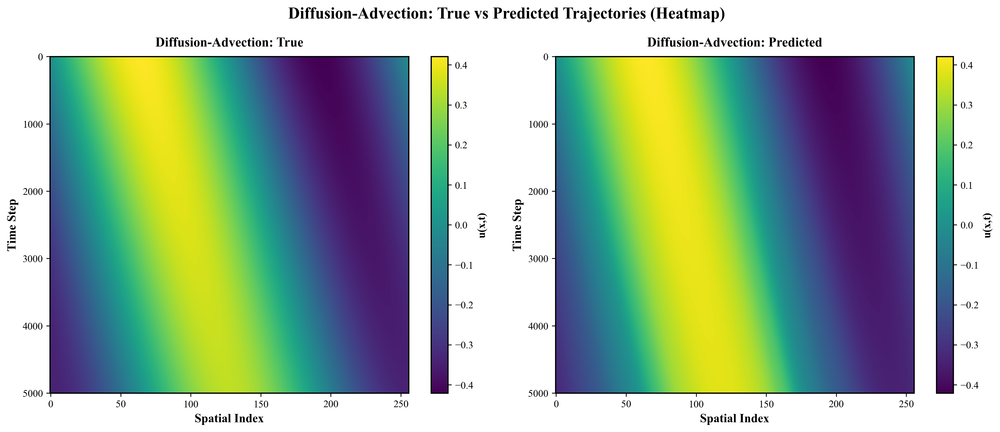

In [ ]:
# %%
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), dpi=300)
fig.suptitle("Diffusion-Advection: True vs Predicted Trajectories (Heatmap)", 
             fontsize=16, fontweight='bold', y=0.98)

im1 = ax1.imshow(rollout_true, aspect="auto", cmap="viridis", interpolation='bilinear')
ax1.set_title("Diffusion-Advection: True", fontsize=13, fontweight='bold', pad=10)
ax1.set_xlabel("Spatial Index", fontsize=12, fontweight='bold')
ax1.set_ylabel("Time Step", fontsize=12, fontweight='bold')
cbar1 = plt.colorbar(im1, ax=ax1)
cbar1.set_label("u(x,t)", fontsize=11, fontweight='bold')

im2 = ax2.imshow(rollout_pred, aspect="auto", cmap="viridis", interpolation='bilinear')
ax2.set_title("Diffusion-Advection: Predicted", fontsize=13, fontweight='bold', pad=10)
ax2.set_xlabel("Spatial Index", fontsize=12, fontweight='bold')
ax2.set_ylabel("Time Step", fontsize=12, fontweight='bold')
cbar2 = plt.colorbar(im2, ax=ax2)
cbar2.set_label("u(x,t)", fontsize=11, fontweight='bold')

plt.tight_layout()
# Save as PDF in advection figures folder (vector graphics preserve quality)
fig.savefig('advection figures/advection_heatmap.pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
plt.show()


## Fixed Time Comparison
Plots true vs predicted at a fixed physical time for different multipliers.


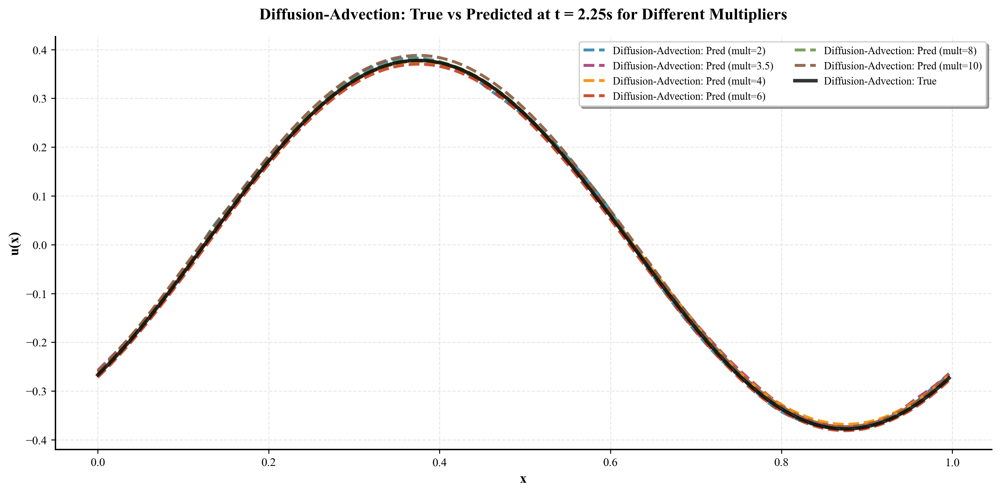

In [ ]:
# %%
# =============================================================
# Plot: True vs Predicted at Fixed Time for Each Multiplier
# =============================================================

dt0 = 1e-4
train_end_step = T_train   # 20000
target_time = 2.25  # Target time in seconds

# Calculate the global step corresponding to target_time
target_global_step = int(target_time / dt0)
target_test_step = target_global_step - train_end_step  # Step within test region

# Only proceed if target time is within test region
if target_test_step > 0 and target_test_step < u_test_true.shape[0]:
    multipliers = [2,  3.5, 4,  6, 8, 10]
    
    fig, ax = plt.subplots(figsize=(12, 6), dpi=300)
    
    colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#6A994E', '#8B5A3C', '#6C5CE7', '#00B894']
    
    for idx, mult in enumerate(multipliers):
        model.eval()
        
        # Run rollout for this multiplier
        u_pred = u_test_true[0].clone().unsqueeze(0)
        rollout_pred_mult = [u_pred[0].detach().cpu().numpy()]
        rollout_true_mult = [u_test_true[0].detach().cpu().numpy()]
        
        steps = int(u_test_true.shape[0] // mult)
        
        with torch.no_grad():
            for t in range(steps - 1):
                u_now = torch.from_numpy(rollout_pred_mult[-1]).to(device)
                
                # Periodic BCs: use torch.roll for neighbors
                u_left  = torch.roll(u_now, +1)   # u[i-1] with periodic wrapping
                u_right = torch.roll(u_now, -1)   # u[i+1] with periodic wrapping
                
                dt_vec = torch.ones_like(u_now) * mult
                
                u_next = model(u_left.unsqueeze(0), u_now.unsqueeze(0), u_right.unsqueeze(0), dt_vec.unsqueeze(0))
                
                # Extract first (and only) batch element: (1, Nx) -> (Nx,)
                u_next = u_next[0] if len(u_next.shape) > 1 else u_next
                
                rollout_pred_mult.append(u_next.detach().cpu().numpy())
                true_idx = int((t + 1) * mult)
                if true_idx < u_test_true.shape[0]:
                    rollout_true_mult.append(u_test_true[true_idx].detach().cpu().numpy())
                else:
                    break
        
        rollout_pred_mult = np.stack(rollout_pred_mult)
        rollout_true_mult = np.stack(rollout_true_mult)
        
        # Find the index in rollout that corresponds to target_time
        # For multiplier mult, each step advances by mult*dt0 in physical time
        target_rollout_step = int(target_test_step / mult)
        
        # Ensure index is within bounds
        if target_rollout_step < len(rollout_pred_mult) and target_rollout_step < len(rollout_true_mult):
            # Store predicted solution for this multiplier
            pred_at_time = rollout_pred_mult[target_rollout_step]
            
            ax.plot(x, pred_at_time, 
                   label=f"Diffusion-Advection: Pred (mult={mult})", 
                   linewidth=2.5, color=colors[idx % len(colors)], alpha=0.9, linestyle='--')
    
    # Plot true solution once (same for all multipliers at the same time)
    true_at_time = u_test_true[target_test_step].detach().cpu().numpy()
    ax.plot(x, true_at_time, label="Diffusion-Advection: True", 
           linewidth=3, color='black', alpha=0.8, linestyle='-', zorder=10)
    
    ax.set_title(f"Diffusion-Advection: True vs Predicted at t = {target_time}s for Different Multipliers", 
                fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel("x", fontsize=12, fontweight='bold')
    ax.set_ylabel("u(x)", fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
    ax.legend(ncol=2, frameon=True, fancybox=True, shadow=True, fontsize=9)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    # Save as PDF in advection figures folder (vector graphics preserve quality)
    fig.savefig(f'advection figures/advection_fixed_time_{target_time}s.pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
    plt.show()
else:
    print(f"Target time {target_time}s is outside the test region. Test region spans from t={train_end_step*dt0:.3f}s to t={(train_end_step + u_test_true.shape[0])*dt0:.3f}s")
